In [186]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sweetviz
import pandas_profiling as pp
import math
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [146]:
df=pd.read_csv('Housing.csv')

In [147]:
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1.0,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2.0,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2.0,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3.0,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3.0,222,18.7,396.90,5.33,36.2


In [148]:
def chn(newcol,col,data):
    data[newcol]=data[col]
    data=data.drop(col,axis=1)
    return data

In [149]:
da=chn("crime rate","CRIM",df)
da=chn("Res Zone","ZN",da)
da=chn("Indus","INDUS",da)
da=chn("river trace","CHAS",da)
da=chn("NO concentration","NOX",da)
da=chn("Average rooms","RM",da)
da=chn("Dis to EMP centres","DIS",da)
da=chn("Dis to Highways","RAD",da)
da=chn("Price","TAX",da)
da=chn("Teachers ratio","PTRATIO",da)
da=chn("Blacks in town","B",da)
da=chn("Lower stat pop","LSTAT",da)
da=chn("owner occupation","MEDV",da)

In [150]:
da

,AGE,crime rate,Res Zone,Indus,river trace,NO concentration,Average rooms,Dis to EMP centres,Dis to Highways,Price,Teachers ratio,Blacks in town,Lower stat pop,owner occupation
0,65.2,0.00632,18.0,2.31,0,0.538,6.575,4.0900,1.0,296,15.3,396.90,4.98,24.0
1,78.9,0.02731,0.0,7.07,0,0.469,6.421,4.9671,2.0,242,17.8,396.90,9.14,21.6
2,61.1,0.02729,0.0,7.07,0,0.469,7.185,4.9671,2.0,242,17.8,392.83,4.03,34.7
3,45.8,0.03237,0.0,2.18,0,0.458,6.998,6.0622,3.0,222,18.7,394.63,2.94,33.4
4,54.2,0.06905,0.0,2.18,0,0.458,7.147,6.0622,3.0,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,69.1,0.06263,0.0,11.93,0,0.573,6.593,2.4786,1.0,273,21.0,391.99,9.67,22.4
505,76.7,0.04527,0.0,11.93,0,0.573,6.120,2.2875,1.0,273,21.0,396.90,9.08,20.6
506,91.0,0.06076,0.0,11.93,0,0.573,6.976,2.1675,1.0,273,21.0,396.90,5.64,23.9
507,89.3,0.10959,0.0,11.93,0,0.573,6.794,2.3889,1.0,273,21.0,393.45,6.48,22.0


In [151]:
da.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509 entries, 0 to 508
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   AGE                 508 non-null    float64
 1   crime rate          509 non-null    float64
 2   Res Zone            509 non-null    float64
 3   Indus               506 non-null    float64
 4   river trace         509 non-null    int64  
 5   NO concentration    507 non-null    float64
 6   Average rooms       509 non-null    float64
 7   Dis to EMP centres  509 non-null    float64
 8   Dis to Highways     508 non-null    float64
 9   Price               509 non-null    int64  
 10  Teachers ratio      509 non-null    float64
 11  Blacks in town      509 non-null    float64
 12  Lower stat pop      508 non-null    float64
 13  owner occupation    509 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.8 KB


In [152]:
da.describe(include="all")

,AGE,crime rate,Res Zone,Indus,river trace,NO concentration,Average rooms,Dis to EMP centres,Dis to Highways,Price,Teachers ratio,Blacks in town,Lower stat pop,owner occupation
count,508.000000,509.000000,509.000000,506.000000,509.000000,507.000000,509.000000,509.000000,508.000000,509.000000,509.000000,509.000000,508.000000,509.000000
mean,68.579134,3.707516,11.296660,11.198281,0.068762,0.555216,6.279845,3.787705,9.610236,409.216110,18.463851,356.664892,12.705276,22.501572
std,28.114744,8.732089,23.269781,6.856713,0.253298,0.115633,0.703449,2.101852,8.735069,168.814161,2.161553,91.562469,7.131979,9.183497
min,2.900000,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,45.075000,0.082210,0.000000,5.190000,0.000000,0.449000,5.880000,2.100700,4.000000,279.000000,17.400000,375.330000,7.092500,17.000000
50%,77.150000,0.261690,0.000000,9.690000,0.000000,0.538000,6.202000,3.182700,5.000000,330.000000,19.100000,391.450000,11.430000,21.200000
75%,94.100000,3.693110,12.500000,18.100000,0.000000,0.624000,6.619000,5.118000,24.000000,666.000000,20.200000,396.240000,16.992500,25.000000
max,100.000000,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [153]:
df.dtypes

CRIM          float64
ZN            float64
INDUS         float64
CHAS            int64
NOX           float64
RM            float64
AGE           float64
DIS           float64
RAD           float64
TAX             int64
PTRATIO       float64
B             float64
LSTAT         float64
MEDV          float64
crime rate    float64
dtype: object

In [154]:
df.isnull().sum()

CRIM          0
ZN            0
INDUS         3
CHAS          0
NOX           2
RM            0
AGE           1
DIS           0
RAD           1
TAX           0
PTRATIO       0
B             0
LSTAT         1
MEDV          0
crime rate    0
dtype: int64

C:\Users\SURIYA\AppData\Local\Temp\ipykernel_9564\3353817919.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df["AGE"])


<Axes: xlabel='AGE', ylabel='Density'>

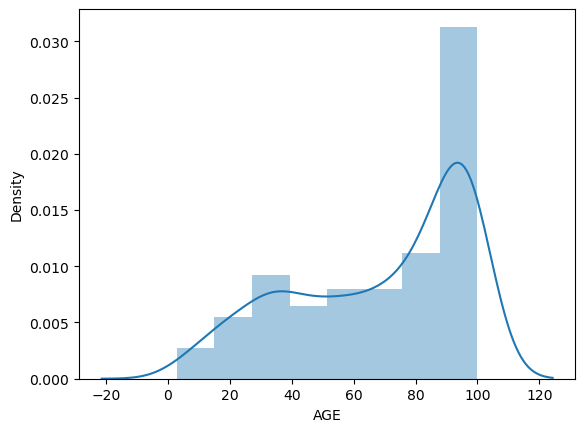

In [155]:
sns.distplot(df["AGE"])

C:\Users\SURIYA\AppData\Local\Temp\ipykernel_9564\4195925407.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(da["Indus"])


<Axes: xlabel='Indus', ylabel='Density'>

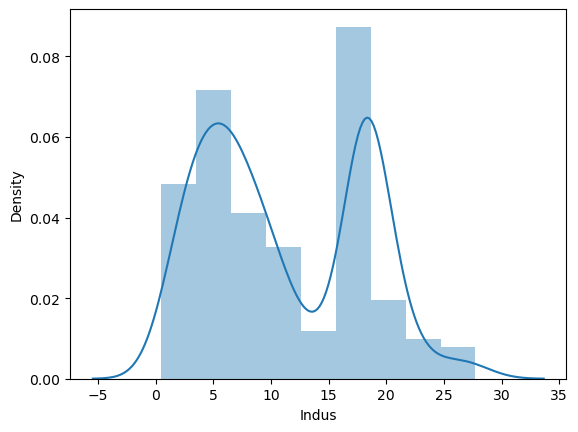

In [161]:
sns.distplot(da["Indus"])

C:\Users\SURIYA\AppData\Local\Temp\ipykernel_9564\876506980.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(da["NO concentration"])


<Axes: xlabel='NO concentration', ylabel='Density'>

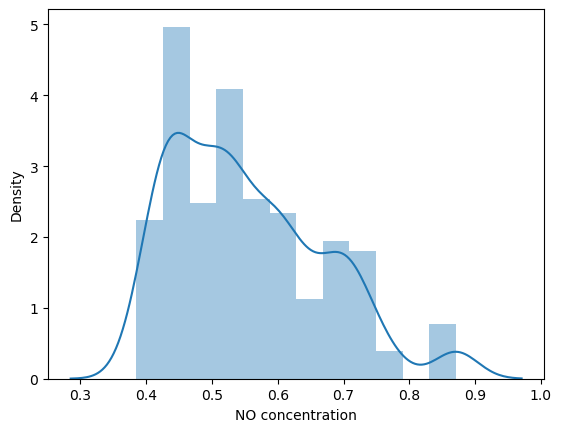

In [162]:
sns.distplot(da["NO concentration"])

C:\Users\SURIYA\AppData\Local\Temp\ipykernel_9564\4079560974.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(da["Dis to Highways"])


<Axes: xlabel='Dis to Highways', ylabel='Density'>

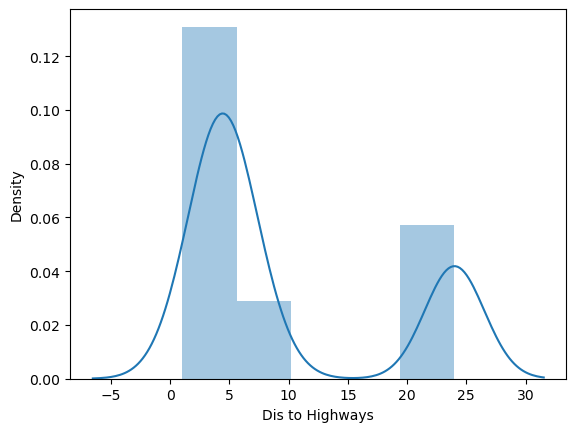

In [163]:
sns.distplot(da["Dis to Highways"])

C:\Users\SURIYA\AppData\Local\Temp\ipykernel_9564\3257842164.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(da["Lower stat pop"])


<Axes: xlabel='Lower stat pop', ylabel='Density'>

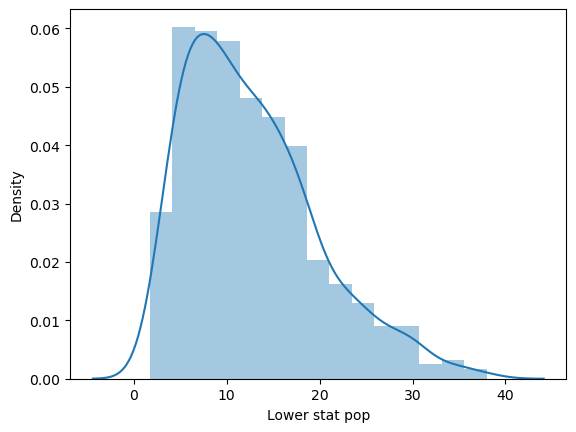

In [164]:
sns.distplot(da["Lower stat pop"])

In [165]:
def pear(col):
    m1=da[col].mean()
    m2=da[col].median()
    m3=da[col].std()
    s1=m1-m2
    s2=3*s1
    s3=s2/m3
    return s3

In [166]:
p1=pear("AGE")
p2=pear("Indus")
p3=pear("NO concentration")
p4=pear("Dis to Highways")
p5=pear("Lower stat pop")

In [167]:
print(p1," ",p2," ",p3," ",p4," ",p5)

-0.914559232144256   0.6599141692829112   0.4466629315653266   1.5833542226060182   0.5364327136477527


In [168]:
da["NO concentration"]=da["NO concentration"].fillna(da["NO concentration"].mean())

In [169]:
da["Lower stat pop"]=da["Lower stat pop"].fillna(da["Lower stat pop"].mean())

In [170]:
df.isnull().sum()

CRIM          0
ZN            0
INDUS         3
CHAS          0
NOX           2
RM            0
AGE           1
DIS           0
RAD           1
TAX           0
PTRATIO       0
B             0
LSTAT         1
MEDV          0
crime rate    0
dtype: int64

In [171]:
temp=da["Indus"].apply(math.sqrt)

In [172]:
da["Indus"]=da["Indus"].fillna(temp.mean())

In [173]:
da.isnull().sum()

AGE                   1
crime rate            0
Res Zone              0
Indus                 0
river trace           0
NO concentration      0
Average rooms         0
Dis to EMP centres    0
Dis to Highways       1
Price                 0
Teachers ratio        0
Blacks in town        0
Lower stat pop        0
owner occupation      0
dtype: int64

In [174]:
df=da.dropna()

In [175]:
df.isnull().sum()

AGE                   0
crime rate            0
Res Zone              0
Indus                 0
river trace           0
NO concentration      0
Average rooms         0
Dis to EMP centres    0
Dis to Highways       0
Price                 0
Teachers ratio        0
Blacks in town        0
Lower stat pop        0
owner occupation      0
dtype: int64

<Axes: >

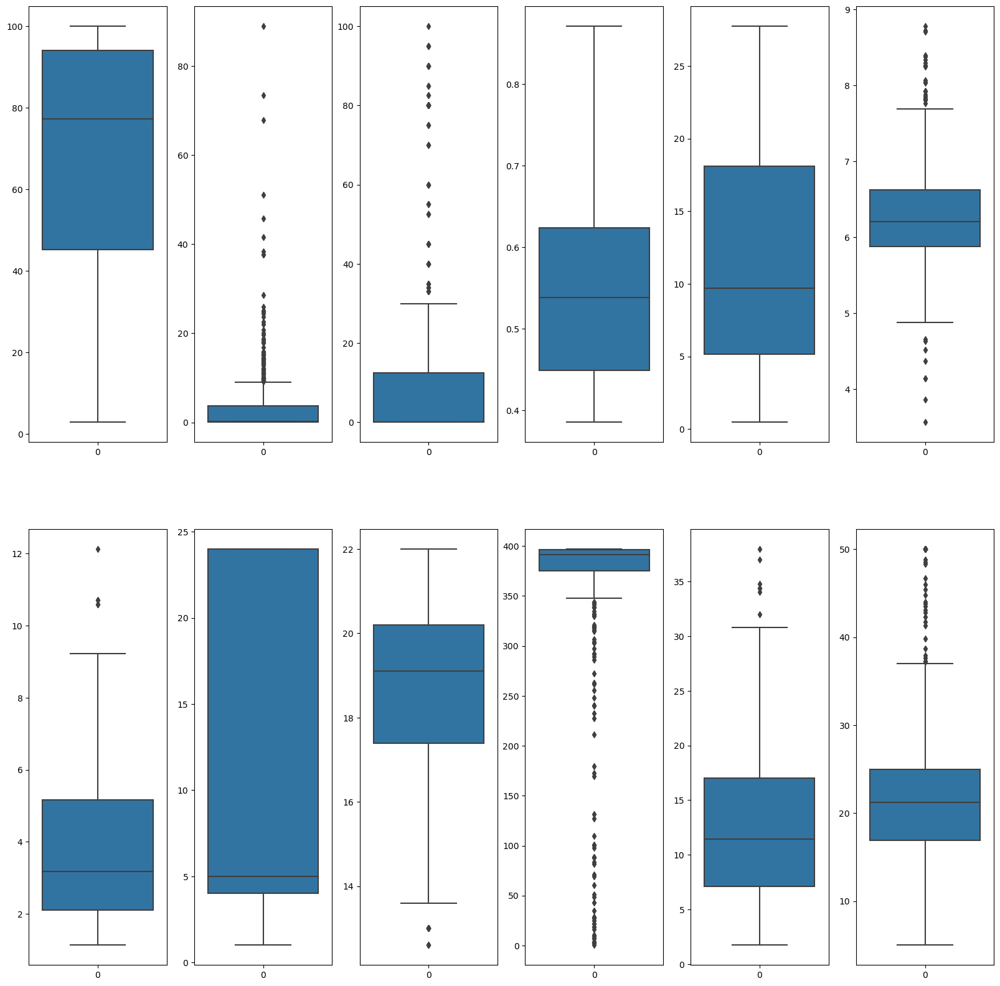

In [176]:
plt.figure(figsize=(20,20))

plt.subplot(2,6,1)
sns.boxplot(df["AGE"])

plt.subplot(2,6,2)
sns.boxplot(df["crime rate"])

plt.subplot(2,6,3)
sns.boxplot(df["Res Zone"])

plt.subplot(2,6,4)
sns.boxplot(df["NO concentration"])

plt.subplot(2,6,5)
sns.boxplot(df["Indus"])

plt.subplot(2,6,6)
sns.boxplot(df["Average rooms"])

plt.subplot(2,6,7)
sns.boxplot(df["Dis to EMP centres"])

plt.subplot(2,6,8)
sns.boxplot(df["Dis to Highways"])

plt.subplot(2,6,9)
sns.boxplot(df["Teachers ratio"])

plt.subplot(2,6,10)
sns.boxplot(df["Blacks in town"])

plt.subplot(2,6,11)
sns.boxplot(df["Lower stat pop"])

plt.subplot(2,6,12)
sns.boxplot(df["owner occupation"])


In [177]:
df.columns

Index(['AGE', 'crime rate', 'Res Zone', 'Indus', 'river trace',
       'NO concentration', 'Average rooms', 'Dis to EMP centres',
       'Dis to Highways', 'Price', 'Teachers ratio', 'Blacks in town',
       'Lower stat pop', 'owner occupation'],
      dtype='object')

C:\Users\SURIYA\AppData\Local\Temp\ipykernel_9564\2648886530.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df["Price"])


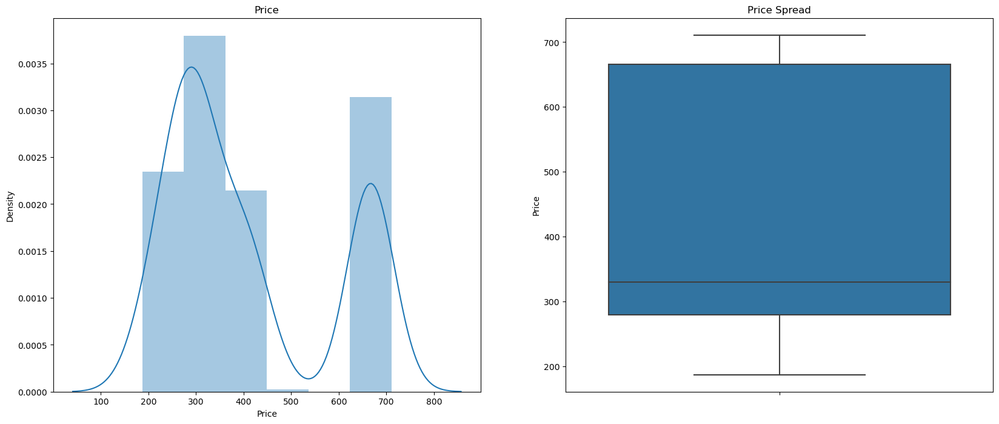

In [178]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Price')
sns.distplot(df["Price"])

plt.subplot(1,2,2)
plt.title('Price Spread')
sns.boxplot(y=df["Price"])

plt.show()

In [179]:
print(df["Price"].describe(percentiles=[0.25,0.50,0.75,0.85,0.90,1]))

count    507.000000
mean     409.372781
std      169.083302
min      187.000000
25%      279.000000
50%      330.000000
75%      666.000000
85%      666.000000
90%      666.000000
100%     711.000000
max      711.000000
Name: Price, dtype: float64


<Axes: xlabel='river trace', ylabel='Count'>

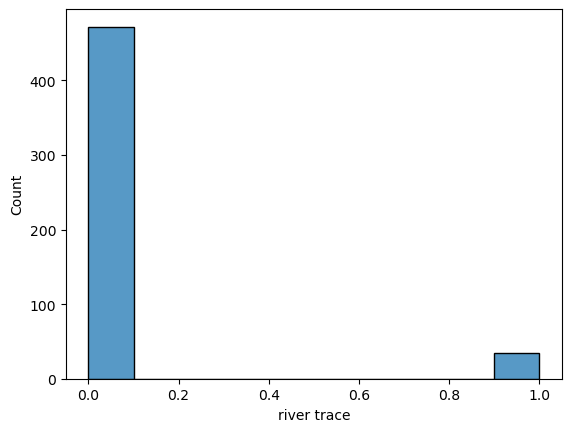

In [180]:
sns.histplot(df["river trace"])

In [181]:
df.columns

Index(['AGE', 'crime rate', 'Res Zone', 'Indus', 'river trace',
       'NO concentration', 'Average rooms', 'Dis to EMP centres',
       'Dis to Highways', 'Price', 'Teachers ratio', 'Blacks in town',
       'Lower stat pop', 'owner occupation'],
      dtype='object')

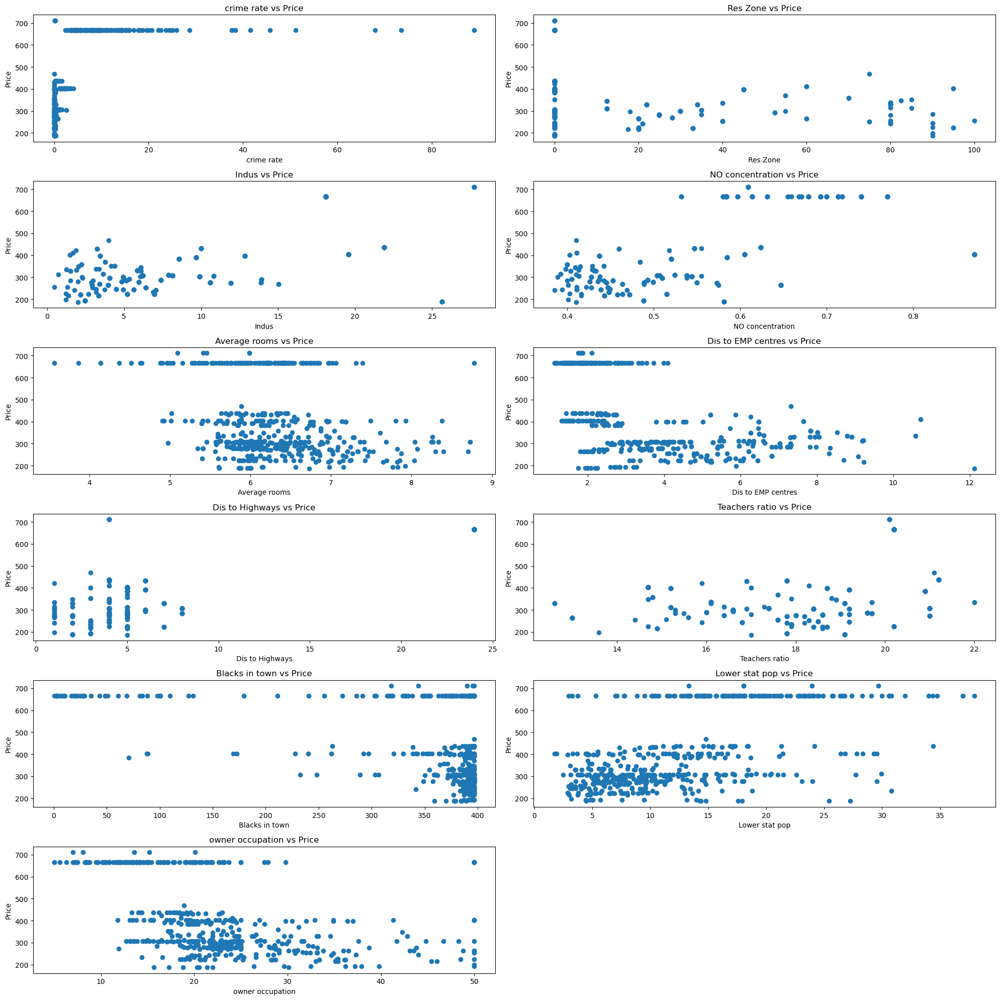

In [182]:
def scatter(x,fig):
    plt.subplot(6,2,fig)
    plt.scatter(df[x],df['Price'])
    plt.title(x+' vs Price')
    plt.ylabel('Price')
    plt.xlabel(x)

plt.figure(figsize=(20,20))

scatter('crime rate', 1)
scatter('Res Zone', 2)
scatter('Indus', 3)
scatter('NO concentration', 4)
scatter('Average rooms', 5)
scatter('Dis to EMP centres', 6)
scatter('Dis to Highways', 7)
scatter('Teachers ratio', 8)
scatter('Blacks in town', 9)
scatter('Lower stat pop', 10)
scatter('owner occupation', 11)

plt.tight_layout()

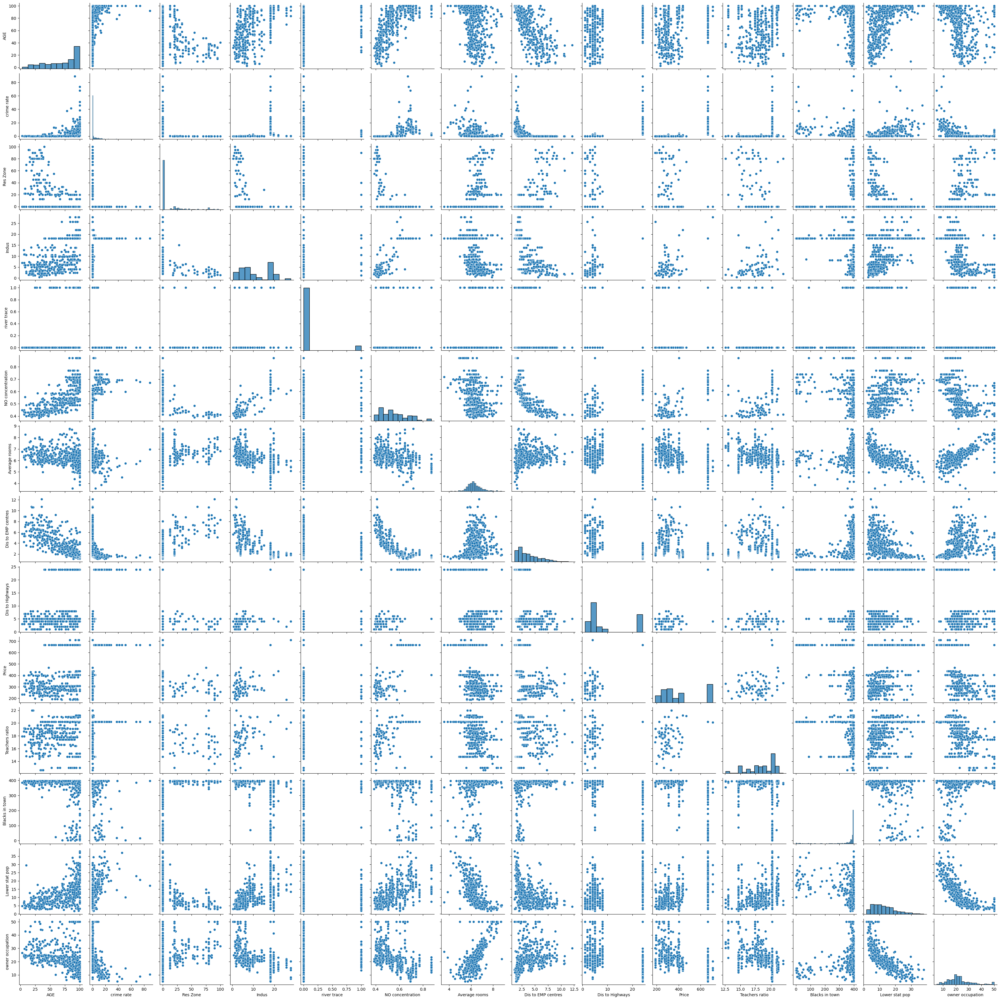

In [183]:
sns.pairplot(df)
plt.show()

In [131]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [229]:
featureconfig=sweetviz.FeatureConfig(force_cat=["Price"])

In [230]:
myreport=sweetviz.analyze(df,None,featureconfig)

C:\Users\SURIYA\AppData\Local\anaconda3\lib\site-packages\sweetviz\dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
C:\Users\SURIYA\AppData\Local\anaconda3\lib\site-packages\sweetviz\dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()


                                             |                                             | [  0%]   00:00 ->…

C:\Users\SURIYA\AppData\Local\anaconda3\lib\site-packages\sweetviz\series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
C:\Users\SURIYA\AppData\Local\anaconda3\lib\site-packages\sweetviz\series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
C:\Users\SURIYA\AppData\Local\anaconda3\lib\site-packages\sweetviz\series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
C:\Users\SURIYA\AppData\Local\anaconda3\lib\site-packages\sweetviz\series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprec

In [231]:
myreport.show_html("housing_prices.html")

Report housing_prices.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [184]:
cols=df.columns
cols

Index(['AGE', 'crime rate', 'Res Zone', 'Indus', 'river trace',
       'NO concentration', 'Average rooms', 'Dis to EMP centres',
       'Dis to Highways', 'Price', 'Teachers ratio', 'Blacks in town',
       'Lower stat pop', 'owner occupation'],
      dtype='object')

In [187]:
sc = StandardScaler()
df[cols]=sc.fit_transform(df[cols])

C:\Users\SURIYA\AppData\Local\Temp\ipykernel_9564\307691994.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[cols]=sc.fit_transform(df[cols])


In [188]:
df.head()

,AGE,crime rate,Res Zone,Indus,river trace,NO concentration,Average rooms,Dis to EMP centres,Dis to Highways,Price,Teachers ratio,Blacks in town,Lower stat pop,owner occupation
0,-0.123184,-0.424949,0.286007,-1.288201,-0.27231,-0.149473,0.417420,0.143178,-0.986691,-0.671177,-1.462666,0.439446,-1.085024,0.162266
1,0.365047,-0.422546,-0.487127,-0.595270,-0.27231,-0.746792,0.198609,0.560276,-0.872190,-0.990861,-0.305551,0.439446,-0.501205,-0.098870
2,-0.269297,-0.422549,-0.487127,-0.595270,-0.27231,-0.746792,1.284142,0.560276,-0.872190,-0.990861,-0.305551,0.395034,-1.218348,1.326497
3,-0.814548,-0.421967,-0.487127,-1.307126,-0.27231,-0.842017,1.018442,1.081042,-0.757690,-1.109263,0.111010,0.414676,-1.371320,1.185048
4,-0.515195,-0.417770,-0.487127,-1.307126,-0.27231,-0.842017,1.230149,1.081042,-0.757690,-1.109263,0.111010,0.439446,-1.035904,1.489707


In [189]:
df.describe()

,AGE,crime rate,Res Zone,Indus,river trace,NO concentration,Average rooms,Dis to EMP centres,Dis to Highways,Price,Teachers ratio,Blacks in town,Lower stat pop,owner occupation
count,5.070000e+02,507.000000,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02,5.070000e+02
mean,3.293443e-16,0.000000,1.576648e-17,-2.242344e-16,-5.605860e-17,4.764981e-16,1.205260e-15,-2.382490e-16,-2.242344e-16,5.605860e-17,4.204395e-16,-1.023069e-15,-2.102197e-16,-3.083223e-16
std,1.000988e+00,1.000988,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00,1.000988e+00
min,-2.343390e+00,-0.424949,-4.871269e-01,-1.557513e+00,-2.723096e-01,-1.473964e+00,-3.865037e+00,-1.264616e+00,-9.866907e-01,-1.316466e+00,-2.712350e+00,-3.888073e+00,-1.541133e+00,-1.905061e+00
25%,-8.341489e-01,-0.416277,-4.871269e-01,-8.733157e-01,-2.723096e-01,-9.199284e-01,-5.707844e-01,-8.029838e-01,-6.431896e-01,-7.718180e-01,-4.906898e-01,2.051088e-01,-7.832904e-01,-6.102616e-01
50%,3.080274e-01,-0.395725,-4.871269e-01,-2.138659e-01,-2.723096e-01,-1.494730e-01,-1.040335e-01,-2.882809e-01,-5.286892e-01,-4.698937e-01,2.961484e-01,3.805207e-01,-1.770167e-01,-1.423929e-01
75%,9.067345e-01,-0.002826,4.977166e-02,1.010411e+00,-2.723096e-01,5.950120e-01,4.842005e-01,6.543621e-01,1.646818e+00,1.519255e+00,8.052790e-01,4.324623e-01,6.053850e-01,2.710724e-01
max,1.116995e+00,9.756440,3.808061e+00,2.413743e+00,3.672290e+00,2.733242e+00,3.550406e+00,3.964871e+00,1.646818e+00,1.785659e+00,1.638402e+00,4.394460e-01,3.544830e+00,2.991239e+00


In [190]:
X=df.drop("Price",axis=1)
y=df["Price"]

In [191]:
X_train, X_test, y_train, y_test = train_test_split(X,y , random_state=104,test_size=0.25, shuffle=True)

In [192]:
lr=LinearRegression()

In [193]:
lr.fit(X_train,y_train)

LinearRegression()

In [194]:
y_pred=lr.predict(X_test)

In [196]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - abs(mape)
    print('Model Performance')
    print('Average Error:',np.mean(errors),'degrees.')
    print('Accuracy = ',accuracy)
    return accuracy
base_accuracy = evaluate(lr, X_test, y_test)

Model Performance
Average Error: 0.1896617671673737 degrees.
Accuracy =  77.74791386357484


In [207]:
def ckmodel(X,y):
    X=sm.add_constant(X)
    lm=sm.OLS(y,X).fit()
    print(lm.summary())
    return X

def fact(X):
    newset=pd.DataFrame()
    newset['Features']=X.columns
    newset['factor']=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    newset['factor'] = round(newset['factor'], 2)
    newset = newset.sort_values(by = "factor", ascending = False)
    return(newset)

Model 1

In [208]:
X_train_new = ckmodel(X_train,y_train)

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     209.5
Date:                Tue, 18 Jul 2023   Prob (F-statistic):          1.54e-160
Time:                        03:32:33   Log-Likelihood:                -130.45
No. Observations:                 380   AIC:                             288.9
Df Residuals:                     366   BIC:                             344.1
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0061      0

In [209]:
fact(X_train_new)

,Features,factor
6,NO concentration,4.75
8,Dis to EMP centres,4.62
13,owner occupation,4.27
12,Lower stat pop,3.78
4,Indus,3.15
1,AGE,3.10
9,Dis to Highways,2.86
7,Average rooms,2.73
3,Res Zone,2.29
10,Teachers ratio,2.12
